In [1]:
import os
import glob
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
import tensorflow as tf
import numpy as np
from keras.models import load_model
import numpy as np
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet50
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input as preprocess_inception_resnet_v2
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_inception_v3
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as preprocess_mobilenet_v2
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg16
from tensorflow.keras.applications.vgg19 import preprocess_input as preprocess_vgg19
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input as preprocess_mobilenet_v3
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_efficientnet

import pandas as pd
from sklearn.metrics import classification_report
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

import mediapipe as mp

In [2]:
def get_preprocess_function(base_model_type):
    if base_model_type == 'ResNet50':
        return preprocess_resnet50
    elif base_model_type == 'InceptionResNetV2':
        return preprocess_inception_resnet_v2
    elif base_model_type == 'InceptionV3':
        return preprocess_inception_v3
    elif base_model_type == 'MobileNetV2':
        return preprocess_mobilenet_v2
    elif base_model_type == 'MobileNetV3':
        return preprocess_mobilenet_v3
    elif base_model_type == 'VGG16':
        return preprocess_vgg16
    elif base_model_type == 'VGG19':
        return preprocess_vgg19
    elif base_model_type == 'ResNet50V2':
        return preprocess_inception_resnet_v2
    elif base_model_type == 'EfficientNet':
        return preprocess_efficientnet
    else:
        raise ValueError(
            'Invalid base_model_type.')

In [3]:
def preprocess(file, input_shape):
    face = cv2.imread(file)
    face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
    face = cv2.resize(face, input_shape)
    face = np.expand_dims(face, axis=0)
    return face

In [4]:
def import_ref_embedding(model, input_shape, preprocess_input):
    
    # Load embeddings set
    test_dir = './ref_data/min_data'
    test_embeddings = []
    test_labels = []
    for subdir in os.listdir(test_dir):
        for file in glob.glob(os.path.join(test_dir, subdir, '*.jpg')):
            face = preprocess(file, input_shape)
            # Preprocess image same as training data
            face = preprocess_input(face)

            embedding = model.predict(face, verbose=0)
            test_embeddings.append(embedding.flatten())
            test_labels.append(subdir)

    return test_embeddings, test_labels

In [5]:
def l2_normalize(x):
    return x / np.sqrt(np.sum(np.multiply(x, x)))

def findEuclideanDistance(source_representation, test_representation):
    euclidean_distance = source_representation - test_representation
    euclidean_distance = np.sum(np.multiply(euclidean_distance, euclidean_distance))
    euclidean_distance = np.sqrt(euclidean_distance)
    return euclidean_distance

def predict(feature, all_features, labels):
    distances = np.sqrt(np.sum(np.square(feature - all_features), axis = 1))
    index = np.argmin(distances)

    name = labels[index]
    distance = distances[index]
    return name, distance

In [6]:
def visualize(model, input_shape, ref_embeddings, ref_labels, preprocess_input, model_name):

# Read the names from the text file into a list
    with open("names.txt", "r") as file:
        names = file.read().splitlines()

    true_labels = []
    predicted_labels = []

    dir_path = 'test'
    image_files = os.listdir(dir_path)

    num_columns = 5
    num_rows = len(image_files) // num_columns if len(image_files) % num_columns == 0 else len(image_files) // num_columns + 1

    fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, num_rows * 3))

    true_labels = []
    predicted_labels = []

    correct_predictions = 0
    for i, ax in enumerate(axs.flatten()):
        if i < len(image_files):
            image_path = os.path.join(dir_path, image_files[i])
            
            face = preprocess(image_path, input_shape)
            face = preprocess_input(face)
            
            # image = preprocess_input(image)

            embedding = model.predict(face, verbose=0)
            predicted_label, distance = predict(embedding[0], ref_embeddings, ref_labels)
            predicted_labels.append(str(predicted_label))  # convert number to string before appending

            # Extract the true label from the file name and compare with the predicted label
            true_label = image_files[i][0]
            true_label = str(image_files[i][0])  # ensure it's a string
            true_labels.append(true_label)

            if true_label == predicted_label:
                correct_predictions += 1
            
            

            predicted_name = names[int(predicted_label[0])]
            true_name = names[int(true_label)]

            original_image = cv2.imread(image_path)

            original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

            ax.imshow(original_image)
            ax.set_title(f"True label: {true_name}")
            ax.text(0.5, -0.1, f"Predicted: {predicted_name}, Distance: {distance:.2f}", size=10, ha="center", transform=ax.transAxes)
            ax.axis('off')
        else:
            ax.axis('off')  

    plt.suptitle(model_name, size=20, y=1.02)
    plt.tight_layout()
    plt.show()

    cm = confusion_matrix(true_labels, predicted_labels)

    plt.figure(figsize=(10,10))
    sns.heatmap(cm, annot=True, fmt="d", linewidths=.5, square = True, cmap = 'Blues', xticklabels=names, yticklabels=names, annot_kws={"size": 16}) 
    plt.ylabel('Actual label', fontsize=15) 
    plt.xlabel('Predicted label', fontsize=15) 
    plt.title('Confusion Matrix', size = 20) 
    plt.xticks(fontsize=14)  
    plt.yticks(fontsize=14)
    plt.show()

    return true_labels, predicted_labels, names

## RESNET50

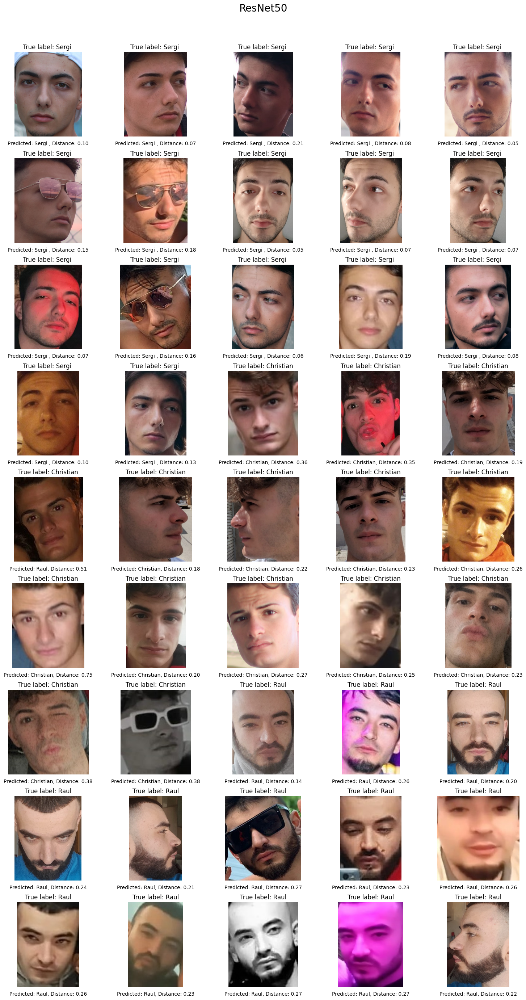

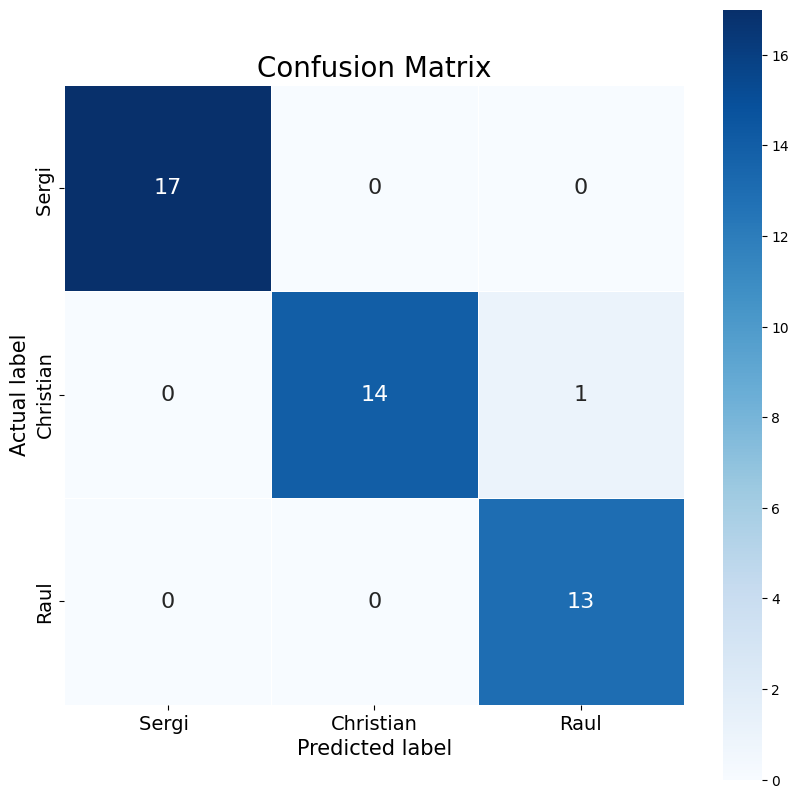

In [7]:
BASE_MODEL_TYPE = 'ResNet50'

model = load_model("triplet_loss_trained_models/" + "ResNet50" )
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3, epsilon=1e-01)
model.compile(optimizer=optimizer)
preprocess_input = get_preprocess_function(BASE_MODEL_TYPE)
ref_embeddings, ref_labels = import_ref_embedding(model, (224,224), preprocess_input)
true_labels, predicted_labels, names = visualize(model, (224,224),ref_embeddings, ref_labels, preprocess_input, BASE_MODEL_TYPE)


In [8]:
report = classification_report(true_labels, predicted_labels, target_names=names, output_dict=True)
df = pd.DataFrame(report).transpose()

# Display as a styled table
df.style.set_table_styles(
    [{'selector': 'th',
    'props': [('background', '#606060'), 
                ('color', 'white'),
                ('font-family', 'verdana')]},
    {'selector': 'td',
    'props': [('font-family', 'verdana')]},
    ]
).set_precision(2)

df.style.background_gradient(cmap='viridis', subset=["precision", "recall", "f1-score"])

C:\Users\sergi\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:13: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  del sys.path[0]


,precision,recall,f1-score,support
Sergi,1.000000,1.000000,1.000000,17.000000
Christian,1.000000,0.933333,0.965517,15.000000
Raul,0.928571,1.000000,0.962963,13.000000
accuracy,0.977778,0.977778,0.977778,0.977778
macro avg,0.976190,0.977778,0.976160,45.000000
weighted avg,0.979365,0.977778,0.977806,45.000000


## InceptionV3

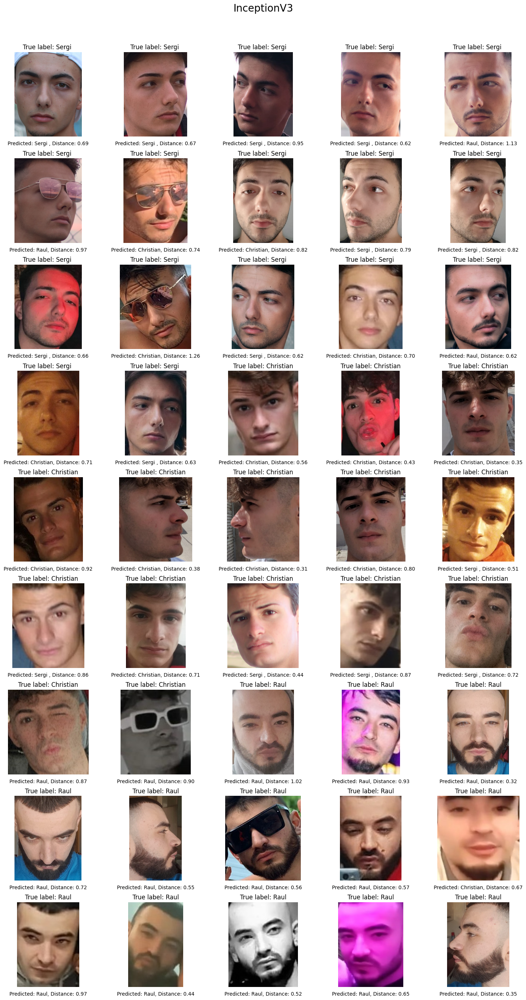

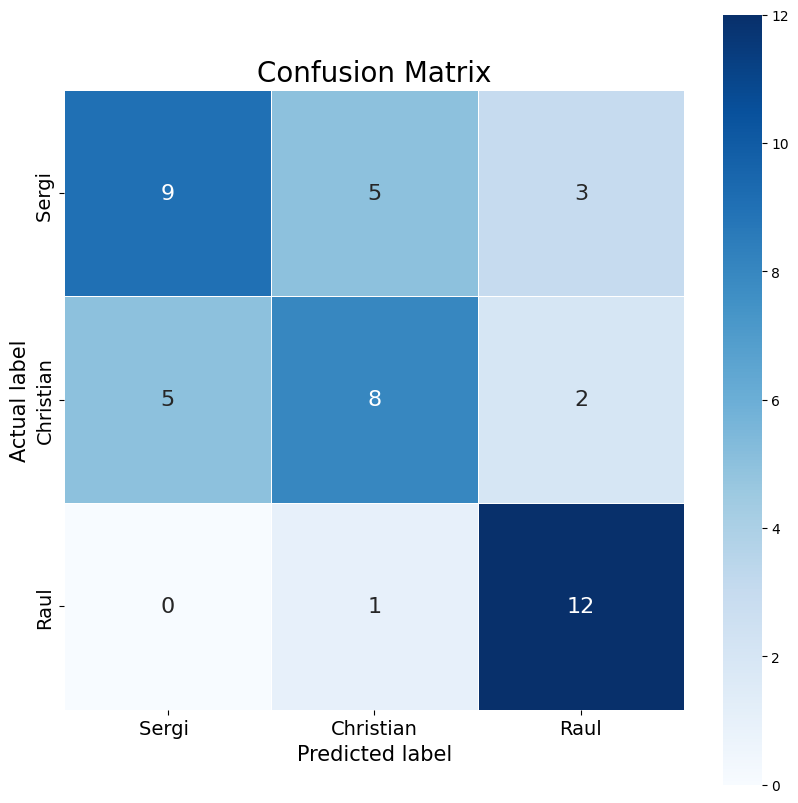

In [9]:
BASE_MODEL_TYPE = 'InceptionV3'

# model = load_model("trained_models/" + "mandragora_MobileNetV3" )
model = load_model("triplet_loss_trained_models/" + "InceptionV3" )
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3, epsilon=1e-01)
model.compile(optimizer=optimizer)
preprocess_input = get_preprocess_function(BASE_MODEL_TYPE)
ref_embeddings, ref_labels = import_ref_embedding(model, (224,224), preprocess_input)
true_labels, predicted_labels, names = visualize(model, (224,224),ref_embeddings, ref_labels, preprocess_input, BASE_MODEL_TYPE)


In [10]:
report = classification_report(true_labels, predicted_labels, target_names=names, output_dict=True)
df = pd.DataFrame(report).transpose()

# Display as a styled table
df.style.set_table_styles(
    [{'selector': 'th',
    'props': [('background', '#606060'), 
                ('color', 'white'),
                ('font-family', 'verdana')]},
    {'selector': 'td',
    'props': [('font-family', 'verdana')]},
    ]
).set_precision(2)

df.style.background_gradient(cmap='viridis', subset=["precision", "recall", "f1-score"])

C:\Users\sergi\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:13: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  del sys.path[0]


,precision,recall,f1-score,support
Sergi,0.642857,0.529412,0.580645,17.000000
Christian,0.571429,0.533333,0.551724,15.000000
Raul,0.705882,0.923077,0.800000,13.000000
accuracy,0.644444,0.644444,0.644444,0.644444
macro avg,0.640056,0.661941,0.644123,45.000000
weighted avg,0.637255,0.644444,0.634374,45.000000


In [ ]:
model_InceptionResNetV2

## MOBILENETV3

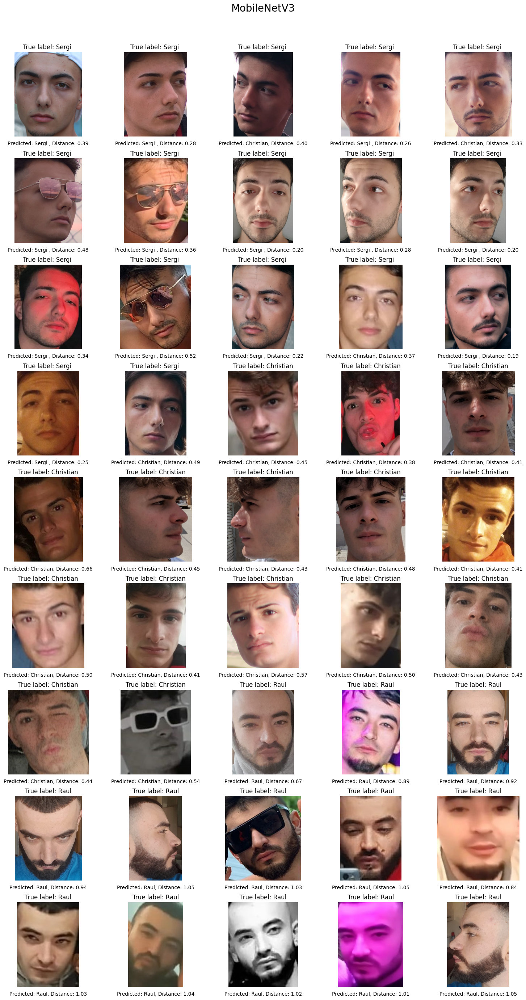

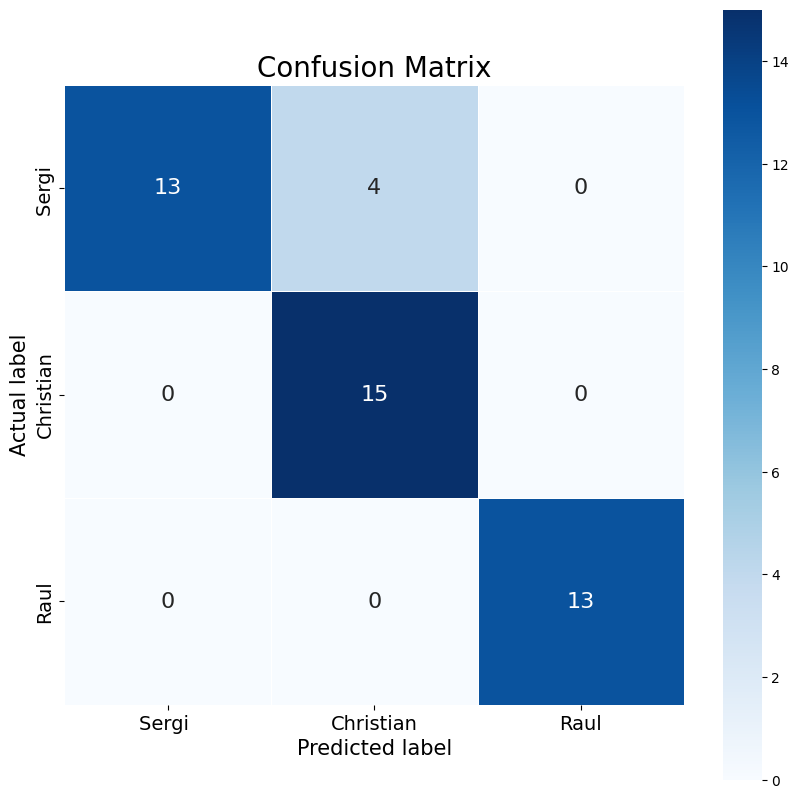

In [11]:
BASE_MODEL_TYPE = 'MobileNetV3'

model = load_model("triplet_loss_trained_models/" + "MobileNetV3")
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3, epsilon=1e-01)
model.compile(optimizer=optimizer)
preprocess_input = get_preprocess_function(BASE_MODEL_TYPE)
ref_embeddings, ref_labels = import_ref_embedding(model, (224,224), preprocess_input)
true_labels, predicted_labels, names = visualize(model, (224,224),ref_embeddings, ref_labels, preprocess_input, BASE_MODEL_TYPE)

In [12]:
report = classification_report(true_labels, predicted_labels, target_names=names, output_dict=True)
df = pd.DataFrame(report).transpose()

# Display as a styled table
df.style.set_table_styles(
    [{'selector': 'th',
    'props': [('background', '#606060'), 
                ('color', 'white'),
                ('font-family', 'verdana')]},
    {'selector': 'td',
    'props': [('font-family', 'verdana')]},
    ]
).set_precision(2)

df.style.background_gradient(cmap='viridis', subset=["precision", "recall", "f1-score"])

C:\Users\sergi\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:13: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  del sys.path[0]


,precision,recall,f1-score,support
Sergi,1.000000,0.764706,0.866667,17.000000
Christian,0.789474,1.000000,0.882353,15.000000
Raul,1.000000,1.000000,1.000000,13.000000
accuracy,0.911111,0.911111,0.911111,0.911111
macro avg,0.929825,0.921569,0.916340,45.000000
weighted avg,0.929825,0.911111,0.910414,45.000000


## EfficientNet

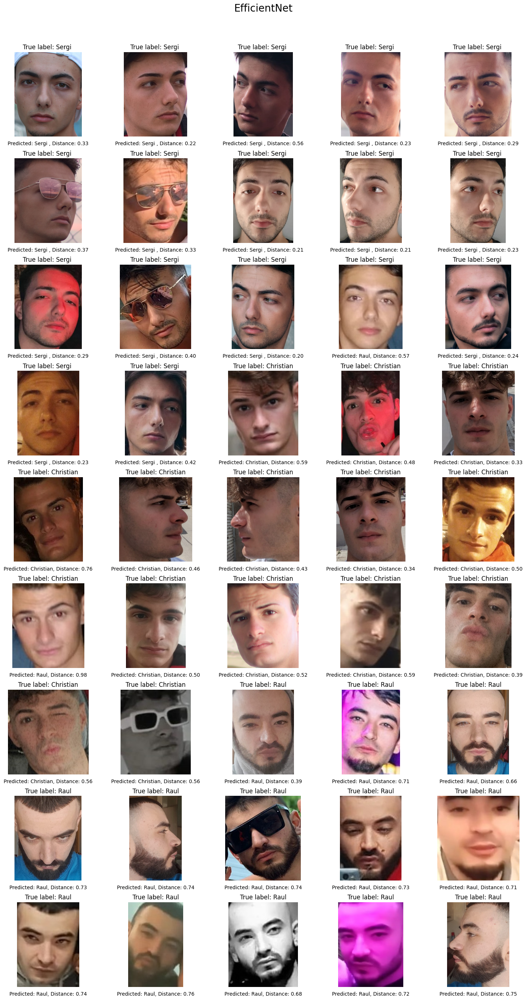

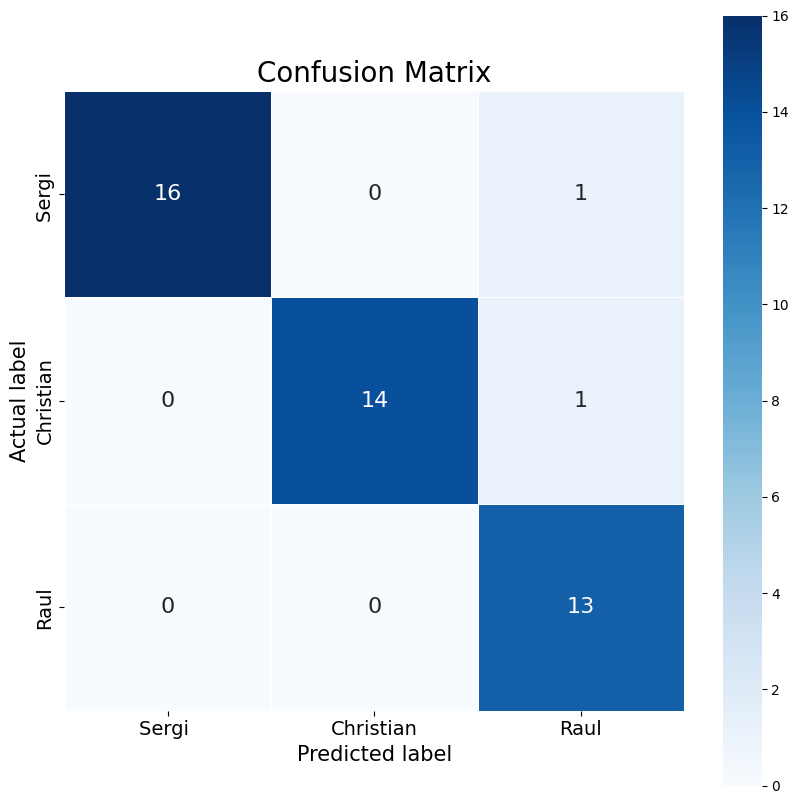

In [13]:
BASE_MODEL_TYPE = 'EfficientNet'

model = load_model("triplet_loss_trained_models/" + "EfficientNet")
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3, epsilon=1e-01)
model.compile(optimizer=optimizer)
preprocess_input = get_preprocess_function(BASE_MODEL_TYPE)
ref_embeddings, ref_labels = import_ref_embedding(model, (224,224), preprocess_input)
true_labels, predicted_labels, names = visualize(model, (224,224),ref_embeddings, ref_labels, preprocess_input, BASE_MODEL_TYPE)

In [14]:
report = classification_report(true_labels, predicted_labels, target_names=names, output_dict=True)
df = pd.DataFrame(report).transpose()

# Display as a styled table
df.style.set_table_styles(
    [{'selector': 'th',
    'props': [('background', '#606060'), 
                ('color', 'white'),
                ('font-family', 'verdana')]},
    {'selector': 'td',
    'props': [('font-family', 'verdana')]},
    ]
).set_precision(2)

df.style.background_gradient(cmap='viridis', subset=["precision", "recall", "f1-score"])

C:\Users\sergi\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:13: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  del sys.path[0]


,precision,recall,f1-score,support
Sergi,1.000000,0.941176,0.969697,17.000000
Christian,1.000000,0.933333,0.965517,15.000000
Raul,0.866667,1.000000,0.928571,13.000000
accuracy,0.955556,0.955556,0.955556,0.955556
macro avg,0.955556,0.958170,0.954595,45.000000
weighted avg,0.961481,0.955556,0.956423,45.000000
